<a href="https://colab.research.google.com/github/JasonManesis/Wildfire-Smoke-Detection/blob/main/Scripts/Wildfires_Detectron2_Main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dataset Visualization (FiftyOne)

In [ ]:
#Mount google drive.
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Install the Fiftyone application.
!pip install fiftyone

In [ ]:
import fiftyone as fo

# A name for the dataset
name ="Wildfires_Training_Data"

# The directory containing the dataset to import.
dataset_dir = "/content/drive/MyDrive/Datasets/Wildfires_2_COCO/train"

# The type of the dataset being imported.
dataset_type = fo.types.COCODetectionDataset  

# Data Loading.
dataset = fo.Dataset.from_dir(dataset_dir, dataset_type, name=name, shuffle=True)

 100% |█████████████████| 516/516 [896.8ms elapsed, 0s remaining, 575.4 samples/s]      


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


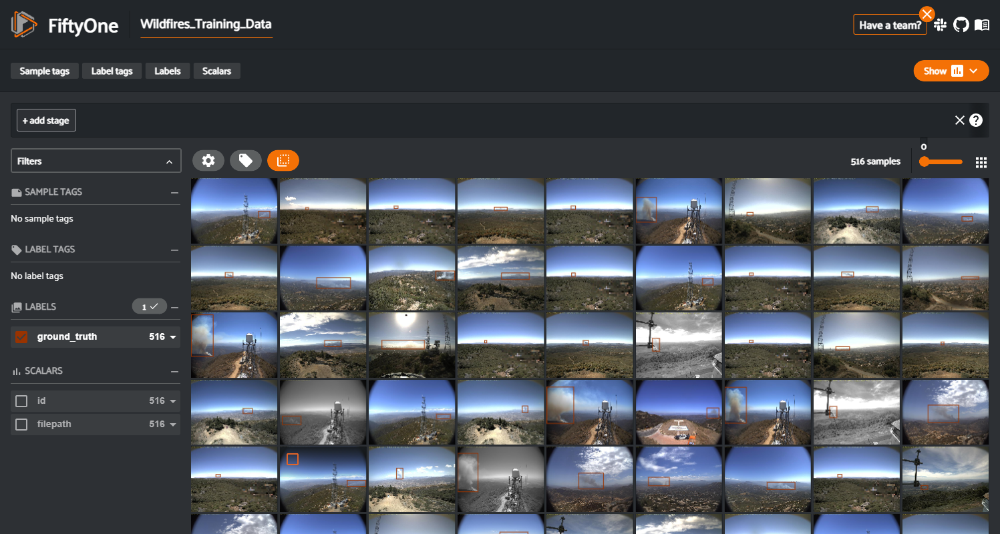

<IPython.core.display.Javascript object>

In [ ]:
#Launch fiftyone session.
session = fo.launch_app(dataset)

In [ ]:
#Freeze fiftyone session.
session.freeze() 

# Install detectron2

In [ ]:
!pip install pyyaml==5.1

# !pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html
# Install detectron2 that matches the above pytorch version, see https://detectron2.readthedocs.io/tutorials/install.html for instructions.

!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html

# After installation, you need to "restart runtime" in Colab. 

In [9]:
import torch, torchvision
from termcolor import colored

# Check pytorch installation:
if '1.9.0+cu102'== torch.__version__: 
    print(colored(f'Pytorch Version is: {torch.__version__}','blue', attrs=['bold'])) 
else: 
    print(colored("You must install install torch == 1.9.0+cu102",'red', attrs=['bold']))
    answer = input('Do you want to install Pytorch version 1.9.0+cu102? [y/n] ')
    if answer=='y': 
        !pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Check GPU properties:
if torch.cuda.is_available():
    gpu = !nvidia-smi -L 
    gpu_name_and_id = "".join(gpu[0].split(":")[1:])
    print(colored("This notebook uses a GPU" + gpu_name_and_id, 'green', attrs=['bold']))
else:
    print(colored("No GPU available",'red', attrs=['bold']))

Pytorch Version is: 1.9.0+cu102
This notebook uses a GPU Tesla K80 (UUID GPU-ed5b5ce5-a323-3ace-20b7-01b1ab3b6d3b)


In [5]:
# Import necessary detectron2 utilities:
import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data import DatasetMapper, build_detection_test_loader
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import ColorMode
from detectron2.config.config import CfgNode as CN
from detectron2.engine import DefaultTrainer
from detectron2.utils.logger import setup_logger, log_every_n_seconds, logging 
from detectron2.engine.hooks import HookBase
from detectron2.evaluation import inference_context
import detectron2.utils.comm as comm
setup_logger() # Setup detectron2 logger

<Logger detectron2 (DEBUG)>

In [6]:
# Import some common libraries:
import numpy as np
import pandas as pd
import random
import yaml 
import os, json, cv2, random, matplotlib
from google.colab.patches import cv2_imshow
from termcolor import colored
import matplotlib.pyplot as plt
import matplotlib.font_manager
import time
import datetime
import pytz
import math

In [28]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# Load and register Train, Test and Validation sets.

In [11]:
dataset_dir = '/content/drive/MyDrive/Datasets/Wildfires_2_COCO'

In [12]:
def register_COCO_datasets(dataset_dir):

    """Loads, registers and names the 3 parts (Train, Test and Validation) of 
    the dataset from the given directory. Every time that the specific function 
    is called it creates a unique name for each one of Train, Test and Validation
    sets, because detectron2 can't register a previous registered dataset with 
    the same dataset name.

    Args:
        dataset_dir (str): Dataset's directory.

    Returns:
        dataset_names (list): A list of train, test and validation set names.

    """
    _, SubFolders, _ = next(os.walk(dataset_dir))

    rint = str(random.randint(0,1000))
    dataset_names = []

    for folder_name in SubFolders:
        files_dir = dataset_dir + '/' + folder_name 
        json_dir = files_dir + '/' + 'labels.json'
        dataset_name = 'Wildfires' + '_' + folder_name + '_' + rint
        register_coco_instances(dataset_name, {}, json_dir, files_dir)
        dataset_names.append(dataset_name)
    
    print(colored(
        f'Datasets: {dataset_names[0]}, {dataset_names[1]}, {dataset_names[2]}\
        \nRegistered successfully!','green', attrs=['bold']))

    return dataset_names

In [13]:
#Register COCO datasets.
dataset_names = register_COCO_datasets(dataset_dir)

Datasets: Wildfires_test_991, Wildfires_train_991, Wildfires_valid_991        
Registered successfully!


In [14]:
def extract_sets_id(dataset_names):

    """Extracts the position of each one of three sets (Train, Test and 
    Validation) and uses it as id for accesing the specific dataset.

    Args:
        dataset_names (list): A list of train, test and validation set names.

    Returns:
        train_id (int): The id of the train set.
        train_id (int): The id of the test set.
        train_id (int): The id of the validation set.

    """

    for i, dataset_name in enumerate(dataset_names):
        if dataset_name.split('_')[1] == 'train': 
            train_id = i
        elif dataset_name.split('_')[1] == 'test':
            test_id = i
        else:
            valid_id = i

    return train_id, test_id, valid_id        

In [15]:
train_id, test_id, valid_id = extract_sets_id(dataset_names)

In [16]:
#Get dicts and metadata from train data.
dicts_train = detectron2.data.get_detection_dataset_dicts(dataset_names[train_id])
metadata_train = MetadataCatalog.get(dataset_names[train_id])

[08/27 12:39:27 d2.data.datasets.coco]: Loaded 516 images in COCO format from /content/drive/MyDrive/Datasets/Wildfires_2_COCO/train/labels.json
[08/27 12:39:27 d2.data.build]: Removed 0 images with no usable annotations. 516 images left.
[08/27 12:39:27 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   smoke    | 516          |
|            |              |


In [17]:
#Get dicts and metadata from test and validation data.
dicts_test = detectron2.data.get_detection_dataset_dicts(dataset_names[test_id])
metadata_test = MetadataCatalog.get(dataset_names[test_id])
dicts_val = detectron2.data.get_detection_dataset_dicts(dataset_names[valid_id])
metadata_val = MetadataCatalog.get(dataset_names[valid_id])

[08/27 12:39:27 d2.data.datasets.coco]: Loaded 74 images in COCO format from /content/drive/MyDrive/Datasets/Wildfires_2_COCO/test/labels.json
[08/27 12:39:27 d2.data.build]: Removed 0 images with no usable annotations. 74 images left.
[08/27 12:39:27 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   smoke    | 74           |
|            |              |
[08/27 12:39:28 d2.data.datasets.coco]: Loaded 147 images in COCO format from /content/drive/MyDrive/Datasets/Wildfires_2_COCO/valid/labels.json
[08/27 12:39:28 d2.data.build]: Removed 0 images with no usable annotations. 147 images left.
[08/27 12:39:28 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   smoke    | 147          |
|            |              |


# Vizs

In [18]:
def dataset_split_viz(dicts_train, dicts_test, dicts_val, figsize=(15,8)):
    
    """Plots a barplot with the proportion of the train, test and validation 
    sets ... 
    and the total number of images that the three above datasets include.

    Args:
        dicts_train (list): List of train dictionaries.
        dicts_train (list): List of train dictionaries.
        dicts_train (list): List of train dictionaries.
        figsize (tuple): Figure size in horizontal and verical axis in inches.

    """
    plt.figure(figsize=figsize)

    heights = [len(dicts_train), len(dicts_test), len(dicts_val)]
    xpos = [1, 1.5, 2]

    #Plot properties:
    plt.bar(xpos, heights, width=0.3, 
            color=['red','green','magenta'], 
            edgecolor='black')
    plt.ylabel('Number of Images')
    plt.grid(color ='grey', linestyle ='-.', linewidth = 1, alpha = 0.6)
    plt.title('Dataset Split', fontweight='bold', horizontalalignment='center', 
              verticalalignment='center', fontsize=12)

    names = ['Train','Test','Validation']
    for i in range(len(xpos)):
        plt.text(xpos[i], heights[i]/2, names[i], fontweight='bold', 
                 horizontalalignment='center', verticalalignment='center', 
                 fontsize=13)
        plt.text(xpos[i], heights[i]/2-25, 
                 str(100*round(heights[i]/sum(heights),2))+'%', 
                 horizontalalignment='center', verticalalignment='center', 
                 fontsize=10 )
        plt.text(xpos[i], heights[i]+10, heights[i], fontweight='bold', 
                 horizontalalignment='center', verticalalignment='center', 
                 fontsize=10 )

    plt.xticks([]);  # Disable xticks.

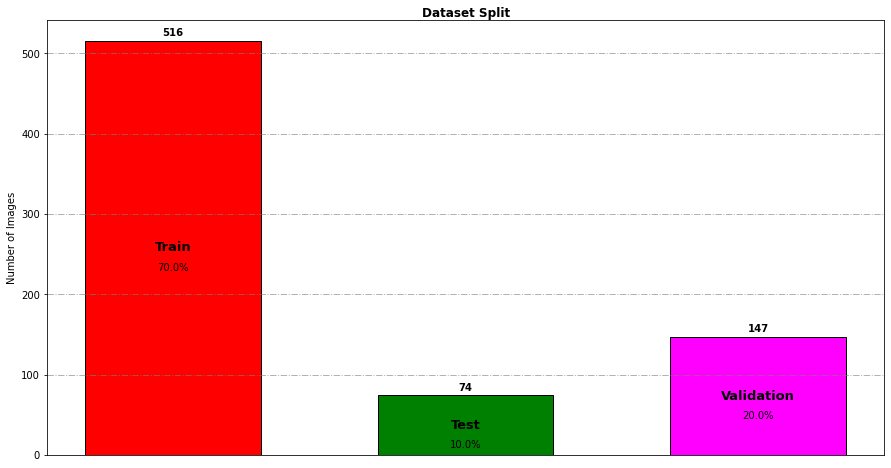

In [19]:
dataset_split_viz(dicts_train,dicts_test,dicts_val,figsize=(15,8))

In [20]:
def show_randimg(dicts, metadata):

    """Selects a random image from the given set and displays it with its 
    annotations.

    Args:
        dicts (list): List of dataset's dictionaries.
        metadata (detectron2.data.catalog.Metadata): Dataset's metadata.
        
    """
    set_names =['train', 'test', 'val']

    #Select a ramdom image from the given set and extract its properties.
    random_im_number = random.randint(0,len(dicts)) 
    random_image_properties = dicts[random_im_number]

    #Read image path.
    path = random_image_properties['file_name'] 
    path_2_list = path.split('/')

    #Read image and add propeties.
    random_image_4_viz = cv2.imread(path) 
    
    #Print image id.
    cv2.putText(
        random_image_4_viz, #numpy array on which text is written
        'Image ID: ' +  str(random_image_properties['image_id']), #text
        (500,450), #position at which writing has to start
        cv2.FONT_HERSHEY_SIMPLEX, #font family
        0.5, #font size
        (255, 0, 255, 0), #font color BGR
        1) #font stroke
    
    #Print set name.
    cv2.putText(random_image_4_viz, path_2_list[6].capitalize() + ' Set', 
                (500,470), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 255, 0), 1) 

    #Visualize the selected image together with its annotations.
    viz = Visualizer(random_image_4_viz, metadata=metadata, scale=1)
    out = viz.draw_dataset_dict(dicts[random_im_number])
    cv2_imshow(out.get_image())

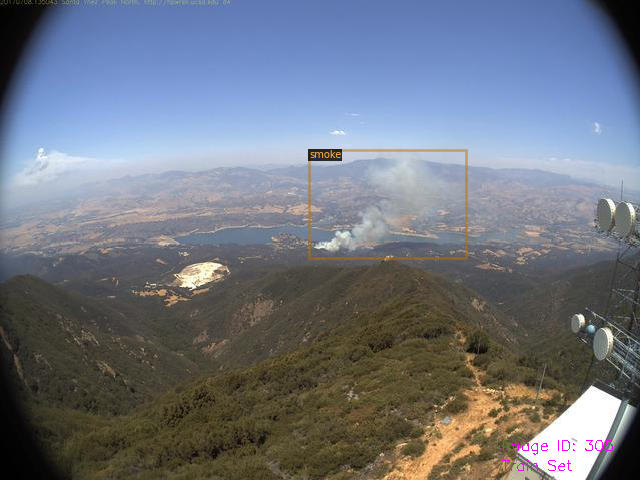

In [24]:
show_randimg(dicts_train, metadata_train)

# Model Configuration

In [ ]:
def datetime_stamp(time_zone = 'Europe/Athens'):  
  
    """Saves the given configuration in the output and session's directories.

    Args:
        time_zone (str): Name of the timezone in which we want the produced 
        date-time stamp.

    Returns: 
        current_date_and_time (str): The current date and time in 
        dd_mm_yyyy__hh_mm format, based on the given timezone.

    """

    timezone = pytz.timezone(time_zone)
    current_date_and_time = datetime.datetime.now(tz=timezone)
    current_date_and_time = current_date_and_time.strftime("%d_%m_%Y__%H_%M")

    return current_date_and_time

In [26]:
#Get config properties.
cfg = get_cfg()
cfg_dir = '/content/drive/MyDrive/Projects/Python_Projects/Wildfires_\
Detectron2/configuration_17_08_2021__16_22.yaml' #saved configuration's dir.
cfg.merge_from_file(cfg_dir) #load saved configuration properties.
cfg_dir_colored = colored(cfg_dir,'blue', attrs=['bold'])
if type(cfg) == detectron2.config.config.CfgNode: 
    print(f'Model configuration successfully loaded from: {cfg_dir_colored}')
out_dir = colored(cfg.OUTPUT_DIR,'blue', attrs=['bold'])
print(f'The ouput directory is: {out_dir}')

Model configuration successfully loaded from: /content/drive/MyDrive/Projects/Python_Projects/Wildfires_Detectron2/configuration_17_08_2021__16_22.yaml
The ouput directory is: /content/drive/MyDrive/output_2021_08_17__16_22


In [ ]:
def General_Config(cfg):

    """General configuration settings the of the model.

    Args:
        cfg (detectron2.config.config.CfgNode): Configuration node for 
        parameterization.

    Returns: 
        _C (detectron2.config.config.CfgNode): Parameterized configuration 
        node of the model.

    """
    _C = cfg

    #Fixed Parameters.
    #cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
    _C.DATASETS.TRAIN = (dataset_names[1],) #Training Data!!!
    _C.DATASETS.TEST = (dataset_names[0],) #Validation Data!!!
    _C.DATALOADER.NUM_WORKERS = 2 #MAX==2! (for Colab)

    #Model weights:
    # _C.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # If we want the training to initialize from model zoo.
    _C.MODEL.WEIGHTS = "/content/drive/MyDrive/output_2021_08_18__14_31/model_0002999.pth" # If we want the training to initialize from another trained model.
    #Else, if we want to train a model from scratch we comment the above line.

    #Training parameters:
    _C.SOLVER.LR_SCHEDULER_NAME = "WarmupCosineLR"
    _C.SOLVER.GAMMA = 0.00005 
    _C.SOLVER.STEPS = (500,) # The iteration number to decrease learning rate by GAMMA.
    _C.SOLVER.IMS_PER_BATCH = 4
    _C.SOLVER.BASE_LR = 0.0008  # pick a good LR
    _C.SOLVER.MAX_ITER = 5000   # 300 iterations 
    _C.SOLVER.STEPS = []        # do not decay learning rate
    _C.SOLVER.CHECKPOINT_PERIOD = 1500 # Save a checkpoint after every this number of iterations
    _C.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (smoke). 

    # Directory where output files are written
    _C.OUTPUT_DIR = '/content/drive/MyDrive/output'+'_'+ datetime_stamp()

    return _C

In [ ]:
cfg = General_Config(cfg)

# Train!




In [10]:
#Gpu memory allocation:
torch.cuda.memory_summary(device=None, abbreviated=False)

'|===========================================================================|\n|                  PyTorch CUDA memory summary, device ID 0                 |\n|---------------------------------------------------------------------------|\n|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |\n|===========================================================================|\n|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |\n|---------------------------------------------------------------------------|\n| Allocated memory      |       0 B  |       0 B  |       0 B  |       0 B  |\n|       from large pool |       0 B  |       0 B  |       0 B  |       0 B  |\n|       from small pool |       0 B  |       0 B  |       0 B  |       0 B  |\n|---------------------------------------------------------------------------|\n| Active memory         |       0 B  |       0 B  |       0 B  |       0 B  |\n|       from large pool |       0 B  |       0 B  |

In [ ]:
#TRAINING:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[08/12 15:34:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
# Plot training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 513), started 6:59:18 ago. (Use '!kill 513' to kill it.)

<IPython.core.display.Javascript object>

# Use custom hooks and re-train the model.

Because the default training loop implemented in detectron2's framework doesn't plot the loss in the validation set during training, we must use a custom hook that does the above task. The two following code cells are doing this exact job, and they are copied from: https://gist.github.com/ortegatron/c0dad15e49c2b74de8bb09a5615d9f6b  




In [ ]:
class LossEvalHook(HookBase):   
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        self.trainer.storage.put_scalars(timetest=12)

In [ ]:
class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks

In [ ]:
# Because the checkpoint saves trainer.scheduler.milestones, 
# trainer.resume_or_load(resume=True) will take the old milestones from the 
# checkpoint and override the scheduler config.This can be fixed by overriding
# the milestones again (after calling resume_or_load) with: 
# trainer.scheduler.milestones=Config.SOLVER.STEPS

os.makedirs(Config.OUTPUT_DIR, exist_ok=True)

Config.defrost() #for Config editing.
Config.DATASETS.TRAIN = (dataset_names[1],)
Config.DATASETS.TEST = (dataset_names[2],)
Config.TEST.EVAL_PERIOD = 500

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

torch.cuda.empty_cache()
trainer = MyTrainer(Config)
trainer.resume_or_load(resume=True)
trainer.scheduler.milestones=Config.SOLVER.STEPS
trainer.train()

[08/18 14:03:58 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


[08/18 14:04:41 d2.utils.events]:  eta: 2:17:44  iter: 19  total_loss: 0.08199  loss_cls: 0.01589  loss_box_reg: 0.04201  loss_rpn_cls: 0.008572  loss_rpn_loc: 0.01332  time: 1.6584  data_time: 0.1706  lr: 1.4533e-05  max_mem: 2627M
[08/18 14:05:15 d2.utils.events]:  eta: 2:17:43  iter: 39  total_loss: 0.07768  loss_cls: 0.01507  loss_box_reg: 0.04301  loss_rpn_cls: 0.007502  loss_rpn_loc: 0.01181  time: 1.6680  data_time: 0.0161  lr: 2.8989e-05  max_mem: 2627M
[08/18 14:05:49 d2.utils.events]:  eta: 2:18:08  iter: 59  total_loss: 0.0754  loss_cls: 0.01682  loss_box_reg: 0.03991  loss_rpn_cls: 0.00785  loss_rpn_loc: 0.01103  time: 1.6778  data_time: 0.0131  lr: 4.3446e-05  max_mem: 2627M
[08/18 14:06:23 d2.utils.events]:  eta: 2:17:59  iter: 79  total_loss: 0.07358  loss_cls: 0.01272  loss_box_reg: 0.04041  loss_rpn_cls: 0.006449  loss_rpn_loc: 0.01401  time: 1.6831  data_time: 0.0132  lr: 5.7902e-05  max_mem: 2627M
[08/18 14:06:57 d2.utils.events]:  eta: 2:17:37  iter: 99  total_loss:

# Results

In [30]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a 
# little bit for inference:

# Path to the model we just trained.
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg = get_cfg()
# Get 
cfg.merge_from_file('/content/drive/MyDrive/Projects/Python_Projects/Wildfires_Detectron2/configuration_17_08_2021__16_22.yaml')
cfg.MODEL.WEIGHTS = '/content/drive/MyDrive/Projects/Python_Projects/Wildfires_Detectron2/output_2021_08_18__17_03/model_0002999.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set a custom testing threshold
predictor = DefaultPredictor(cfg)

In [31]:
def show_results(noi_2_display, dataset_dicts, dataset_metadata):

    """Shows a given number of images with their predictions/annotations.

    Args:
        noi_2_display (int): Number of images to display.
        dataset_dicts (list): Input dataset's dicts.
        dataset_metadata (detectron2.data.Catalog.Metadata): 
        Input dataset's metadata.

    """

    for i,d in enumerate(random.sample(dataset_dicts, noi_2_display)):    
        temp_val_image = cv2.imread(d["file_name"]) # read a random image
        # Number of images on each row/column
        imgs_4_display_in_side = math.floor(np.sqrt(noi_2_display)) 

        # Predict amd draw instances in the above random image.
        outputs = predictor(temp_val_image)  
        v = Visualizer(temp_val_image, metadata=dataset_metadata, scale=0.8)
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        
        # Extract input image's shape.
        image_shape = out.get_image().shape
        
        # Initialization of ndarrays.
        if i==0:
            stacked_images = np.zeros(shape=out.get_image().shape+(noi_2_display,))
            rows = np.zeros(shape=(image_shape[0], # height
                                    image_shape[1]*imgs_4_display_in_side, # width
                                    image_shape[2], # number of channels 
                                    imgs_4_display_in_side)) 
        
        # Put text and stack the above annotated image into an ndarray.  
        annotated_image = out.get_image()  

        cv2.putText(annotated_image, 'Image ID: ' +  str(d['image_id']),
                    (int(0.75*image_shape[1]), int(0.95*image_shape[0])), 
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 255, 0), 1) 
        
        stacked_images[:,:,:,i] = annotated_image
    
    # Create one row at a time.
    for i in range(imgs_4_display_in_side):
        rows[:,:,:,i] = np.hstack([stacked_images[:,:,:,hor_number]
                                  for hor_number in range(i*imgs_4_display_in_side, 
                                                          i*imgs_4_display_in_side+
                                                          imgs_4_display_in_side)])
    
    # Stich all rows together.
    collage = np.vstack([rows[:,:,:,i] for i in range(imgs_4_display_in_side)])
    
    # Show results.
    cv2_imshow(collage) 

In [32]:
#Extract dataset's dicts.
dataset_dicts = detectron2.data.get_detection_dataset_dicts(dataset_names[test_id]) 
noi_2_display = 9 #number of images for displaying.

[08/27 12:47:22 d2.data.datasets.coco]: Loaded 74 images in COCO format from /content/drive/MyDrive/Datasets/Wildfires_2_COCO/test/labels.json
[08/27 12:47:22 d2.data.build]: Removed 0 images with no usable annotations. 74 images left.


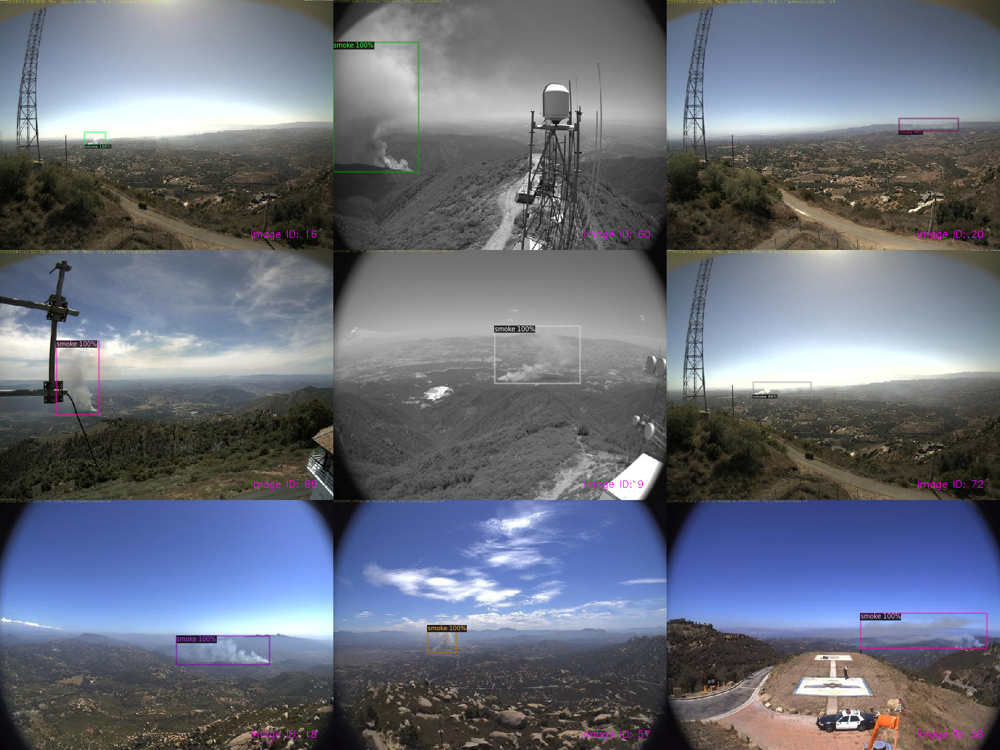

In [34]:
show_results(noi_2_display,dataset_dicts,metadata_test)

# Evaluation

In [35]:
cfg = get_cfg()
cfg.merge_from_file('/content/drive/MyDrive/Projects/Python_Projects/Wildfires_Detectron2/configuration_17_08_2021__16_22.yaml')

In [36]:
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.modeling import build_model
model_path = '/content/drive/MyDrive/Projects/Python_Projects/Wildfires_\
Detectron2/output_2021_08_18__17_03/model_0002999.pth'
cfg.MODEL.WEIGHTS = model_path
predictor = DefaultPredictor(cfg)
model = build_model(cfg) 
DetectionCheckpointer(model).load(model_path);

In [38]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator(dataset_names[test_id])
val_loader = build_detection_test_loader(cfg, dataset_names[test_id])
print(inference_on_dataset(model, val_loader, evaluator ))

[08/27 12:50:42 d2.data.datasets.coco]: Loaded 74 images in COCO format from /content/drive/MyDrive/Datasets/Wildfires_2_COCO/test/labels.json
[08/27 12:50:42 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(480, 480), max_size=640, sample_style='choice')]
[08/27 12:50:42 d2.data.common]: Serializing 74 elements to byte tensors and concatenating them all ...
[08/27 12:50:42 d2.data.common]: Serialized dataset takes 0.02 MiB
[08/27 12:50:42 d2.evaluation.evaluator]: Start inference on 74 batches
[08/27 12:50:46 d2.evaluation.evaluator]: Inference done 11/74. Dataloading: 0.0014 s/iter. Inference: 0.3292 s/iter. Eval: 0.0003 s/iter. Total: 0.3309 s/iter. ETA=0:00:20
[08/27 12:50:51 d2.evaluation.evaluator]: Inference done 27/74. Dataloading: 0.0013 s/iter. Inference: 0.3303 s/iter. Eval: 0.0003 s/iter. Total: 0.3321 s/iter. ETA=0:00:15
[08/27 12:50:57 d2.evaluation.evaluator]: Inference done 43/74. Dataloading: 0.0014 s/iter

# Run the model on video.

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display, HTML
video = YouTubeVideo("5cEr5ZXGUYA?t=6", width=500)
display(video) 

In [ ]:
# Install dependencies and download the video. 
!pip install youtube-dl
!youtube-dl https://youtu.be/5cEr5ZXGUYA -f 22 -o video.mp4

     |████████████████████████████████| 1.9 MB 6.7 MB/s 
[youtube] 5cEr5ZXGUYA: Downloading webpage
[download] Destination: video.mp4
[download] 100% of 5.93MiB in 00:01


In [ ]:
#Crop from 00:00:25 to 00:01:00 for processing.
!ffmpeg -i video.mp4 -ss 00:00:25 -to 00:01:00  -c copy video_cut.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
#Clone detectron2's repository from github.
!git clone https://github.com/facebookresearch/detectron2

Cloning into 'detectron2'...
remote: Enumerating objects: 12812, done.
remote: Counting objects: 100% (313/313), done.
remote: Compressing objects: 100% (183/183), done.
remote: Total 12812 (delta 154), reused 256 (delta 128), pack-reused 12499
Receiving objects: 100% (12812/12812), 5.49 MiB | 11.75 MiB/s, done.
Resolving deltas: 100% (9114/9114), done.


In [ ]:
# Run frame-by-frame inference demo on this video with the "demo.py" tool provided in the detectron2's repository.

%run detectron2/demo/demo.py \
  --config-file /content/drive/MyDrive/configuration_2021_08_17__19_21.yaml \
  --video-input video_cut.mp4 --confidence-threshold 0.6 --output video-output.mkv \
  --opts MODEL.WEIGHTS /content/drive/MyDrive/output_2021_08_18__17_03/model_final.pth

[08/22 10:31:53 detectron2]: Arguments: Namespace(confidence_threshold=0.6, config_file='/content/drive/MyDrive/configuration_2021_08_17__19_21.yaml', input=None, opts=['MODEL.WEIGHTS', '/content/drive/MyDrive/output_2021_08_18__17_03/model_final.pth'], output='video-output.mkv', video_input='video_cut.mp4', webcam=False)
[08/22 10:31:54 fvcore.common.checkpoint]: [Checkpointer] Loading from /content/drive/MyDrive/output_2021_08_18__17_03/model_final.pth ...


100%|██████████| 446/446 [01:23<00:00,  5.35it/s]


In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>